# AlertAI - Data Visualization
This notebook is responsible showing the data and its features with the goal of improve the knowledge and understanding of the problem that we face.
This work is integrated whitin the pipeline of AlertAI component in RideCare Project.

#### by PEILoad

### The steps of this task are:
1. Import Required Libraries 
2. Acquire the Data
3. Data Visualization


## 1. Import Libraries
This section, as name says, is destined to import the libraries that will be used in the file.

In [116]:
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.feature_selection import SelectKBest, chi2, f_classif

## 2. Data Acquisition
Step corresponding to gather the Data in order to manipulate it later on.

In [2]:
rawData = pd.read_csv(r'data\raw_data.csv')
stdData = pd.read_csv(r'data\standarized.csv')
normData = pd.read_csv(r'data\minmax.csv')

Removing id columns that might influence the visualization

In [135]:
#Removing id from RawData
rawData = rawData.drop('sensors.id',axis= 1)
# Removing auto index
normData = normData.drop('Unnamed: 0', axis = 1)
stdData = stdData.drop('Unnamed: 0', axis = 1)

KeyboardInterrupt: 

## 3. Data Visualization
Where we see whats happening!
Section where the data will be shown and worked to better understand what is in front of us.

#### Dataset Preview

##### Raw Data

In [39]:
print('Number of elements:', rawData.shape[0])
rawData.head()

Number of elements: 438


,sensor1.carId,sensor1.carLocation,sensor1.timeValue,sensor1.pm25,sensor1.pm10,sensor1.tags,sensor1.classification
0,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:36,6.3,10.8,"Não existência de fumo, vidros fechados, AC li...",0
1,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:25,6.3,10.3,"Não existência de fumo, vidros fechados, AC li...",0
2,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:14,6.2,8.4,"Não existência de fumo, vidros fechados, AC li...",0
3,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:03,6.1,8.4,"Não existência de fumo, vidros fechados, AC li...",0
4,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:49:52,6.3,8.9,"Não existência de fumo, vidros fechados, AC li...",0


##### Normalized Data

In [40]:
print('Number of elements:', normData.shape[0])
normData.head()

Number of elements: 438


,sensor2.carId,sensor2.carLocation,sensor2.timeValue,sensor2.temperature,sensor2.gas,sensor2.humidity,sensor2.pressure,sensor2.altitude,sensor2.tags,sensor2.classification
0,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:14,21.988203,56356,36.050692,974.004353,331.993571,"Não existência de fumo, vidros fechados, AC li...",0
1,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:03,21.978437,56176,36.341460,974.125433,330.952789,"Não existência de fumo, vidros fechados, AC li...",0
2,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:49:53,21.961445,56356,36.456648,974.275221,329.665380,"Não existência de fumo, vidros fechados, AC li...",0
3,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:49:42,21.942695,55609,36.864439,974.413624,328.475957,"Não existência de fumo, vidros fechados, AC li...",0
4,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:49:31,21.916328,55574,36.762279,974.576691,327.074761,"Não existência de fumo, vidros fechados, AC li...",0


##### Standarized Data

In [41]:
print('Number of elements:', stdData.shape[0])
stdData.head()

Number of elements: 438


,carId,carLocation,timeValue,pm25,pm10,temperature,gas,humidity,pressure,altitude,tags,classification
0,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:36,6.3,10.8,21.988203,56356,36.050692,974.004353,331.993571,"Não existência de fumo, vidros fechados, AC li...",0
1,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:25,6.3,10.3,21.978437,56176,36.341460,974.125433,330.952789,"Não existência de fumo, vidros fechados, AC li...",0
2,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:14,6.2,8.4,21.961445,56356,36.456648,974.275221,329.665380,"Não existência de fumo, vidros fechados, AC li...",0
3,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:50:03,6.1,8.4,21.942695,55609,36.864439,974.413624,328.475957,"Não existência de fumo, vidros fechados, AC li...",0
4,66-ZZ-66,41.5608 -8.3968,2020-11-25 12:49:52,6.3,8.9,21.916328,55574,36.762279,974.576691,327.074761,"Não existência de fumo, vidros fechados, AC li...",0


### Plots
Analyzing plots is one of the best way to see the variations of the data 

#### Scatter plots

Text(0.5, 1.0, 'Scatter plot on particles dataset')

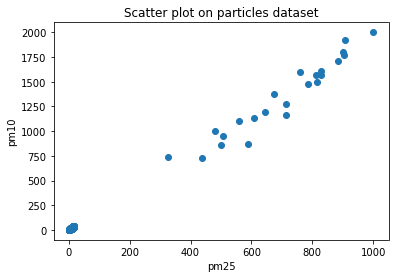

In [14]:
plt.scatter(rawData['sensors.pm25'],rawData['sensors.pm10'])
plt.xlabel('pm25')
plt.ylabel('pm10')
plt.title('Scatter plot on particles dataset')

#### Pairplots

##### Raw Data

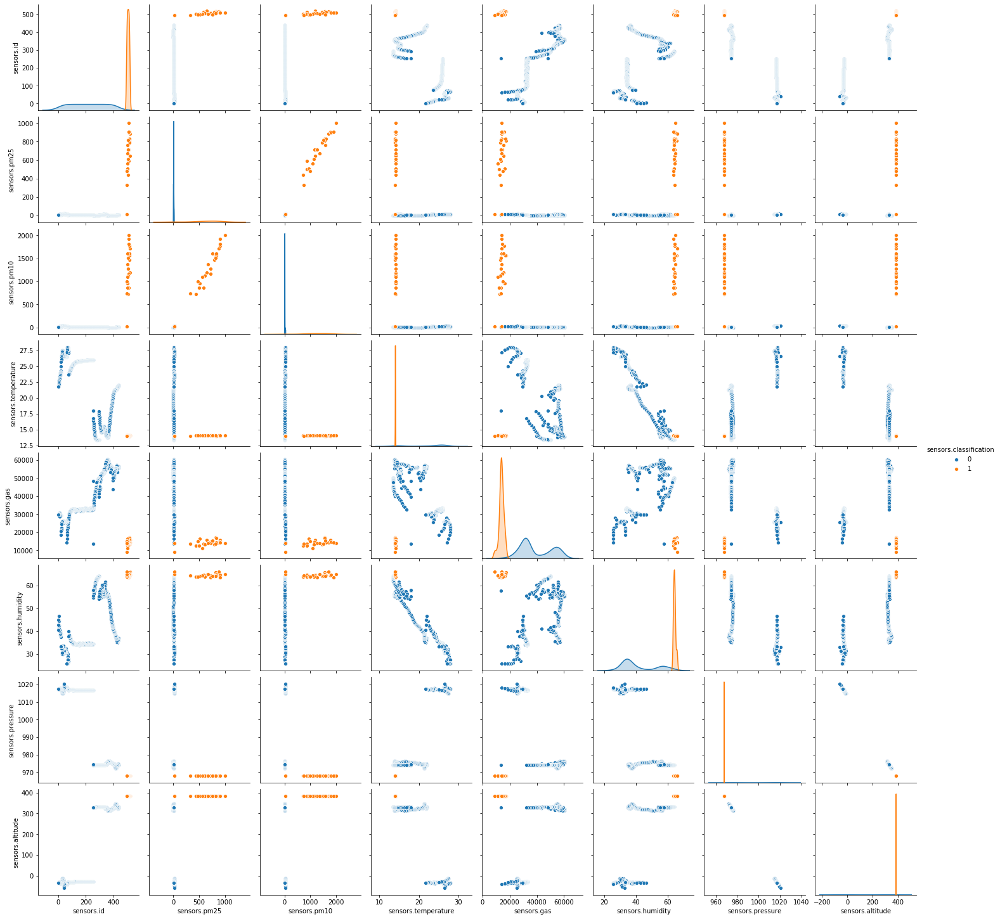

In [16]:
sns.pairplot(hue='sensors.classification',data=rawData)

##### Normalized Data

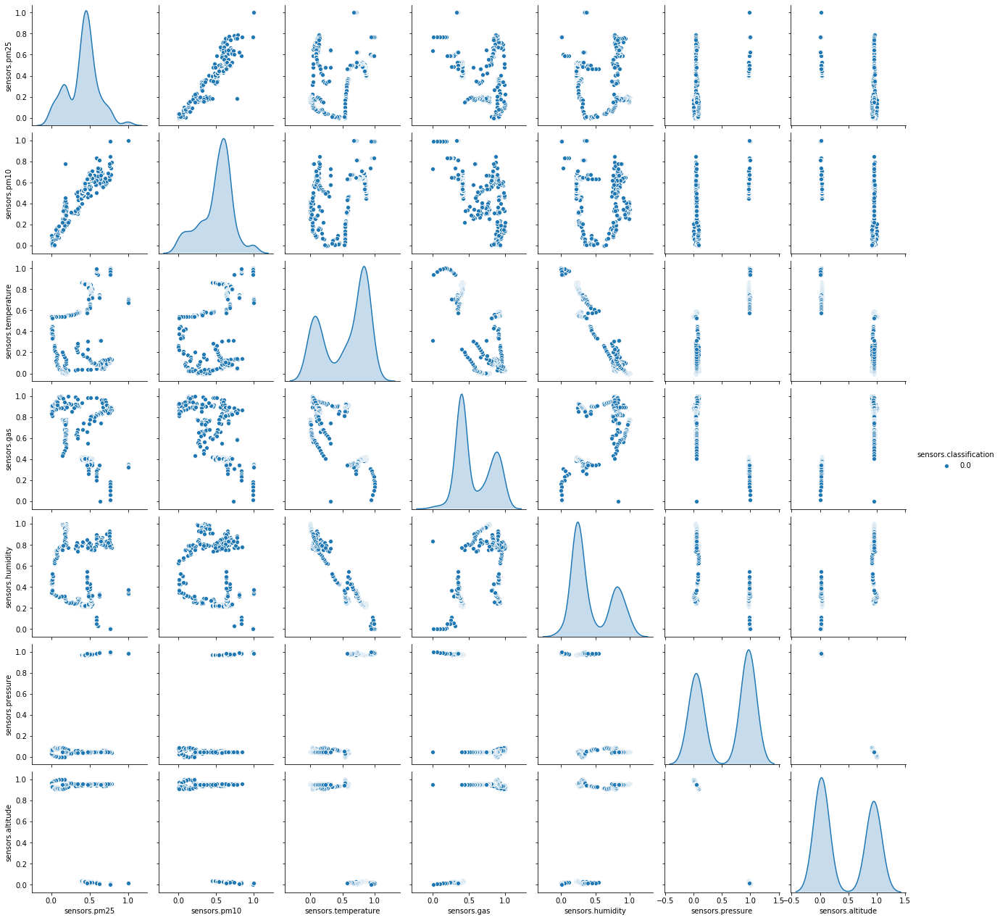

In [17]:
sns.pairplot(hue='sensors.classification',data=normData)

##### Standarized Data

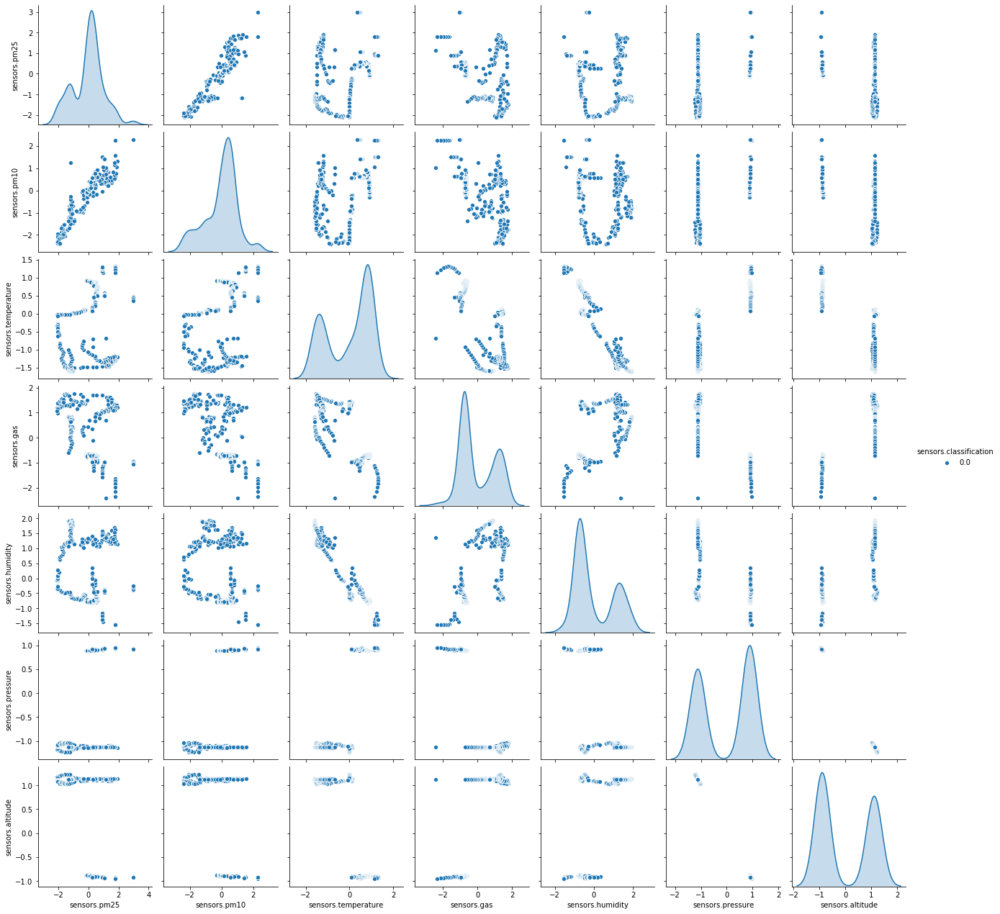

In [20]:
sns.pairplot(hue='sensors.classification',data=stdData)

#### Feature Correlation heatmap

##### Raw Data

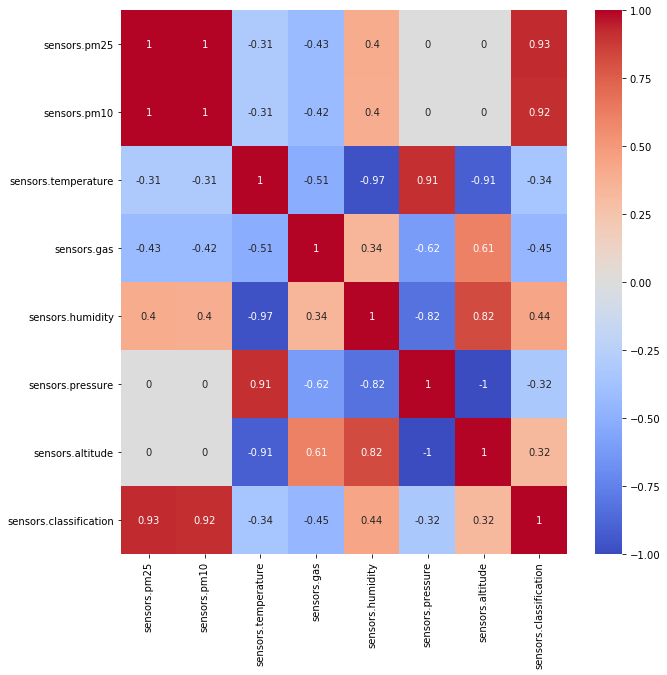

In [128]:
plt.figure(figsize=(10,10))

rawCorrMatrix = rawData.corr()
rawCorrMatrix[np.abs(rawCorrMatrix)<.3] = 0
sns.heatmap(rawCorrMatrix,
            vmin=-1,
            cmap="coolwarm",
            annot=True)

##### Normalized Data

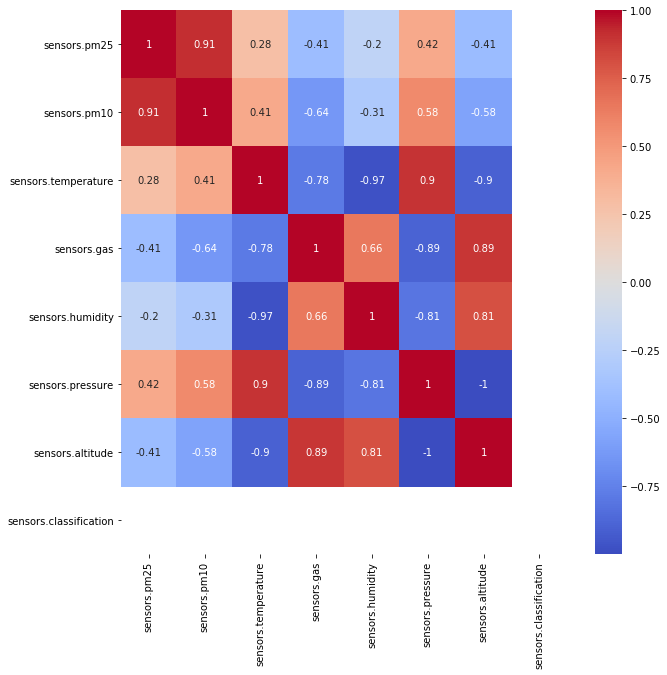

In [127]:
plt.figure(figsize=(10,10))

normCorrMatrix = normData.corr()
sns.heatmap(normCorrMatrix,
            vmin=-1,
            cmap="coolwarm",
            annot=True)

##### Standarized Data

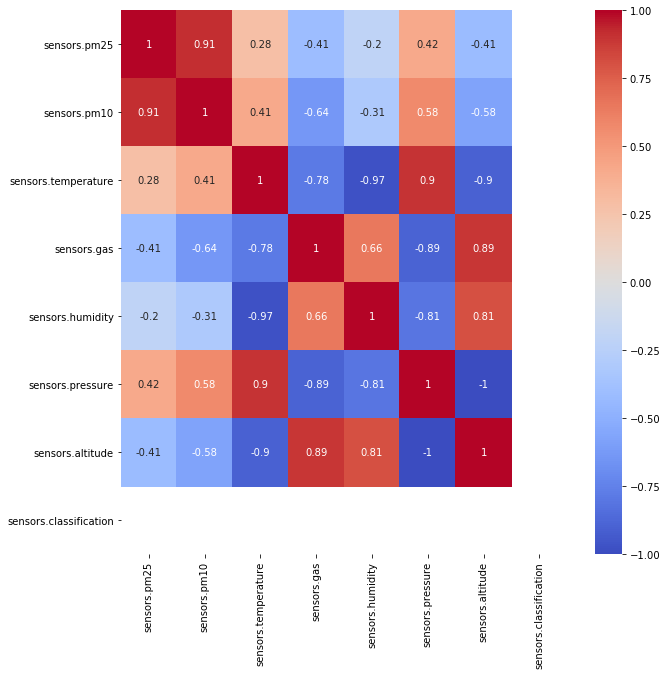

In [134]:
plt.figure(figsize=(10,10))

stdCorrMatrix = stdData.corr()
sns.heatmap(stdCorrMatrix,
            vmin=-1,
            cmap="coolwarm",
            annot=True)

#### Feature Importance for prediction

##### Raw Data

In [118]:
K = 3 # number of features to select
Y = rawData['sensors.classification']
X = rawData.drop(['sensors.classification','sensors.carId','sensors.carLocation','sensors.timeValue','sensors.tags'], axis=1)
allFeatures = (X.columns.values)

kbest = SelectKBest(f_classif, k=K).fit(X, Y)
kbestIndex = kbest.get_support()
kBestFeatures = allFeatures[kbestIndex]
print('The best',K, 'Features are:')
for i,col in enumerate(kBestFeatures):
    print(' -',col)

The best 3 Features are:
 - sensors.pm25
 - sensors.pm10
 - sensors.gas


##### Normalized Data

In [121]:
K = 2 # number of features to select
Y = normData['sensors.classification']
X = normData.drop(['sensors.classification'], axis=1)
allFeatures = (X.columns.values)

kbest = SelectKBest(chi2, k=K).fit(X, Y)
kbestIndex = kbest.get_support()
kBestFeatures = allFeatures[kbestIndex]
print('The best',K, 'Features are:')
for i,col in enumerate(kBestFeatures):
    print(' -',col)

The best 2 Features are:
 - sensors.pressure
 - sensors.altitude


##### Standarized Data

In [122]:
K = 2 # number of features to select
Y = stdData['sensors.classification']
X = stdData.drop(['sensors.classification'], axis=1)
allFeatures = (X.columns.values)

kbest = SelectKBest(f_classif, k=K).fit(X, Y)
kbestIndex = kbest.get_support()
kBestFeatures = allFeatures[kbestIndex]
print('The best',K, 'Features are:')
for i,col in enumerate(kBestFeatures):
    print(' -',col)

The best 2 Features are:
 - sensors.pressure
 - sensors.altitude


### Pos-Algoritmos